In [22]:
import os
import glob
import pickle
import re
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel

#from acea.model_evaluation import evaluation_metrics, model_evaluation_plots
#from acea.models import BaseModel
from acea.scripts import train_and_compare_regressors, create_latex_score_tables, get_best_models_df
from acea.data_loaders import load_data

%matplotlib inline

In [23]:
FORECAST_PERIOD = 60

# Regressors to test

In [24]:
regressors = [LinearRegression(),
              MLPRegressor(random_state=42),
              SVR(),
              RandomForestRegressor(random_state=42),
              GradientBoostingRegressor(random_state=42)
              #GaussianProcessRegressor()
             ]

reg_names = ['LinearModel', 
             'NeuralNetwork', 
             'SVM', 
             'RandomForest', 
             'GradientBoosting' 
             #'GaussianProcess'
            ]

# Load data for basemodel

In [25]:
datadir = '../data'
basedir = os.path.join(datadir, 'featseng', 'D%d'%FORECAST_PERIOD, '*csv')


bfiles = glob.glob(basedir)
dfs_basemodel = load_data(bfiles)


# Compare different sklearn regressors

## Pearson features

In [26]:
featsdir = os.path.join(datadir, 'feats', 'D%d'%FORECAST_PERIOD, 'automatic', 'pearson', '*.csv')

files = glob.glob(featsdir)

dfs = load_data(files)
names = list(dfs.keys())

names

['Aquifer_Auser_Depth_to_Groundwater_COS',
 'Aquifer_Auser_Depth_to_Groundwater_LT2',
 'Aquifer_Auser_Depth_to_Groundwater_SAL',
 'Aquifer_Petrignano_Depth_to_Groundwater_P24',
 'Aquifer_Petrignano_Depth_to_Groundwater_P25',
 'Lake_Bilancino_Flow_Rate',
 'Lake_Bilancino_Lake_Level',
 'River_Arno_Hydrometry_Nave_di_Rosano']

#################### Processing Aquifer_Auser_Depth_to_Groundwater_COS ####################
#################### Processing Aquifer_Auser_Depth_to_Groundwater_LT2 ####################
#################### Processing Aquifer_Auser_Depth_to_Groundwater_SAL ####################
#################### Processing Aquifer_Petrignano_Depth_to_Groundwater_P24 ####################


c:\users\ui914009\documents\code\udacity\mlengineer\capstone_project\acea\venv\lib\site-packages\pandas\plotting\_matplotlib\core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


#################### Processing Aquifer_Petrignano_Depth_to_Groundwater_P25 ####################
#################### Processing Lake_Bilancino_Flow_Rate ####################
#################### Processing Lake_Bilancino_Lake_Level ####################
#################### Processing River_Arno_Hydrometry_Nave_di_Rosano ####################


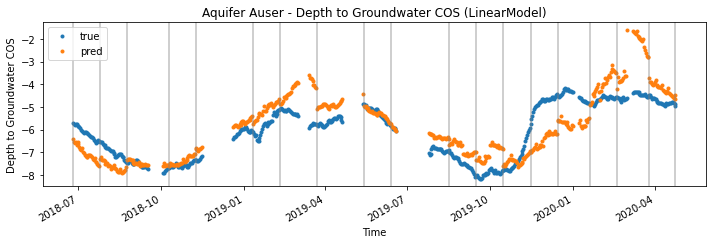

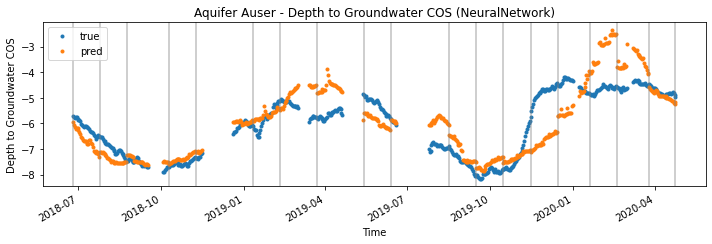

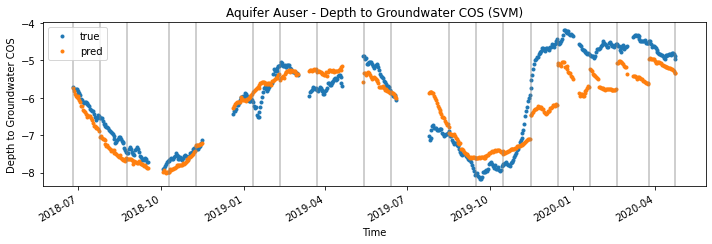

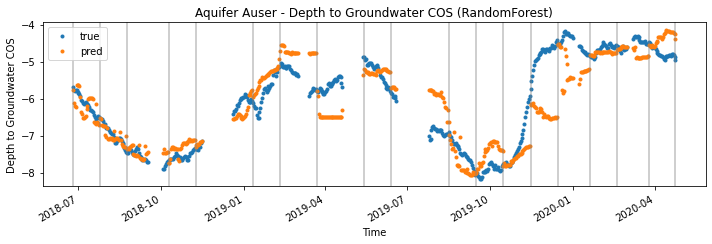

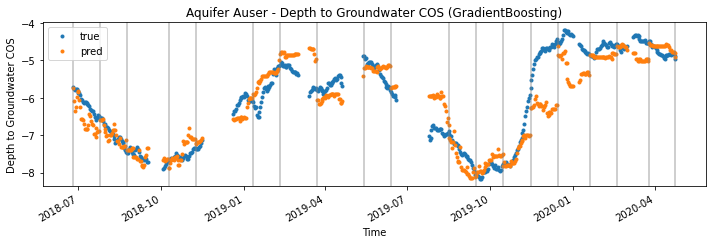

...

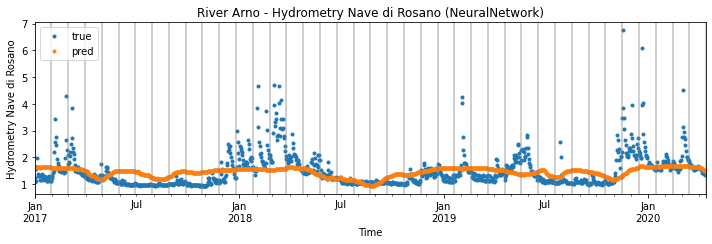

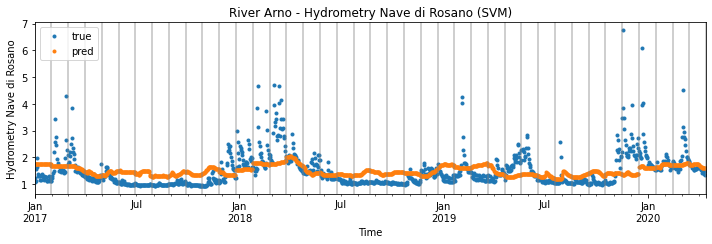

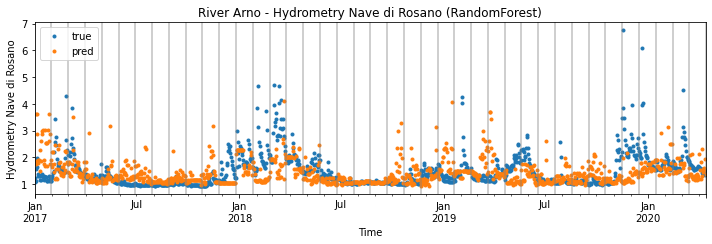

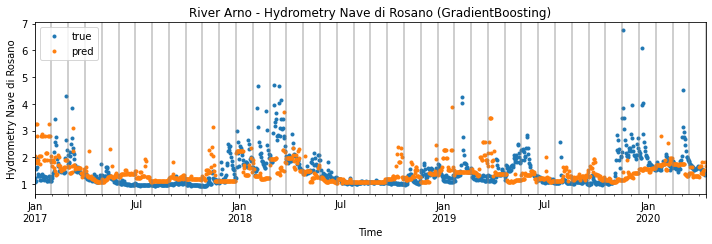

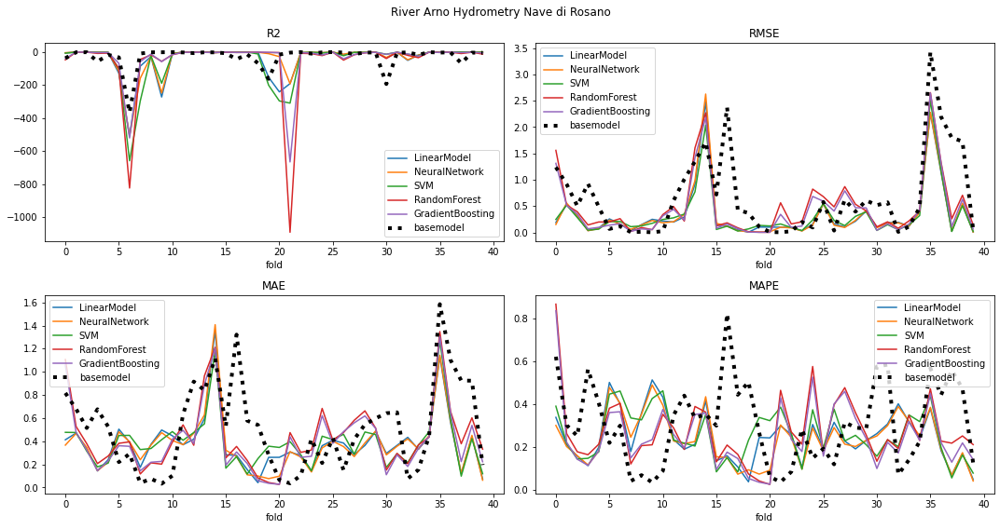

In [27]:
name = 'D%d_pearson'%FORECAST_PERIOD
summary_pearson, dfscores_pearson, dfbasescores = train_and_compare_regressors(names, 
                                                                               dfs, 
                                                                               dfs_basemodel, 
                                                                               reg_names, 
                                                                               regressors, 
                                                                               figname=name)

In [28]:
create_latex_score_tables(dfscores_pearson, 'D%d_pearson'%(FORECAST_PERIOD), echo=False)

## Phik features

In [29]:
featsdir = os.path.join(datadir, 'feats', 'D%d'%FORECAST_PERIOD, 'automatic', 'phik', '*.csv')

files = glob.glob(featsdir)

dfs = load_data(files)
names = list(dfs.keys())


#################### Processing Aquifer_Auser_Depth_to_Groundwater_COS ####################
#################### Processing Aquifer_Auser_Depth_to_Groundwater_LT2 ####################
#################### Processing Aquifer_Auser_Depth_to_Groundwater_SAL ####################
#################### Processing Aquifer_Petrignano_Depth_to_Groundwater_P24 ####################


c:\users\ui914009\documents\code\udacity\mlengineer\capstone_project\acea\venv\lib\site-packages\pandas\plotting\_matplotlib\core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


#################### Processing Aquifer_Petrignano_Depth_to_Groundwater_P25 ####################
#################### Processing Lake_Bilancino_Flow_Rate ####################
#################### Processing Lake_Bilancino_Lake_Level ####################
#################### Processing River_Arno_Hydrometry_Nave_di_Rosano ####################


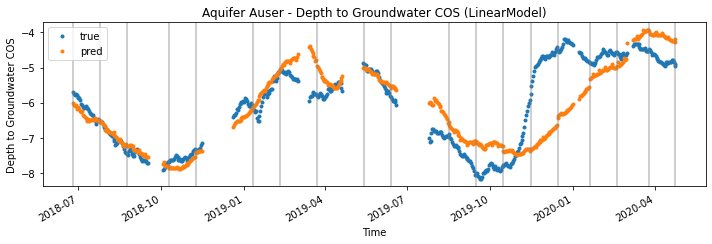

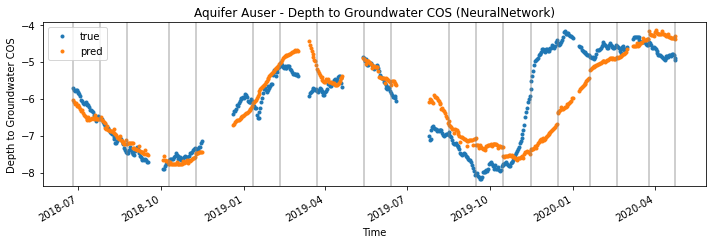

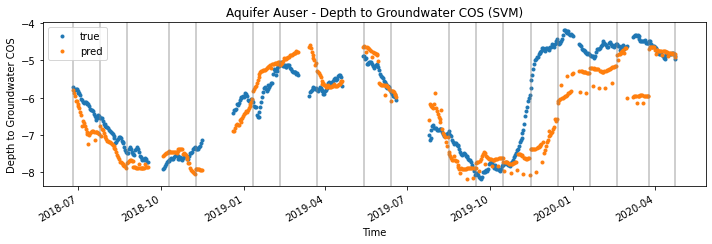

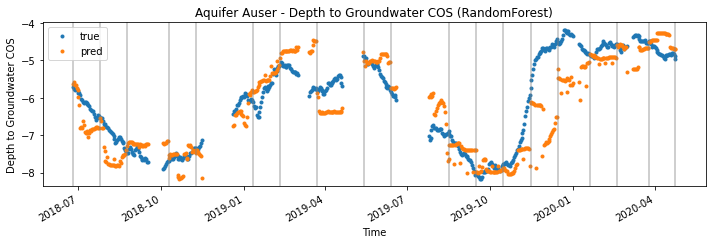

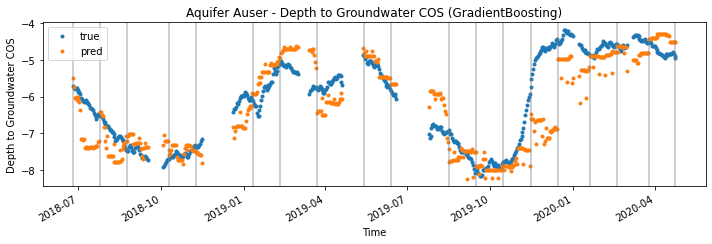

...

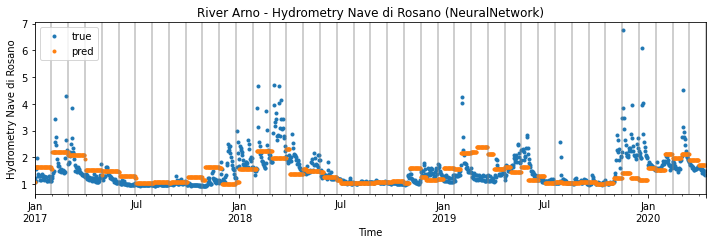

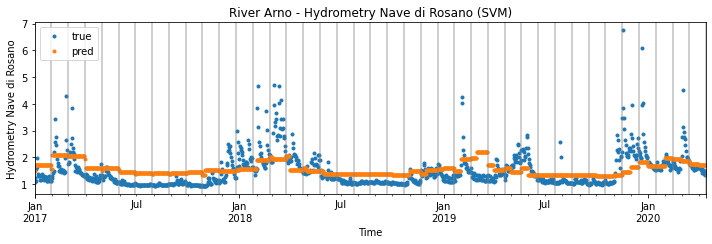

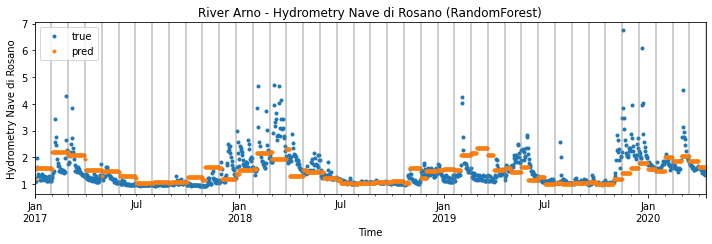

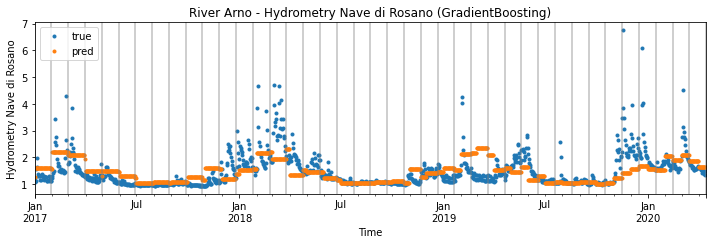

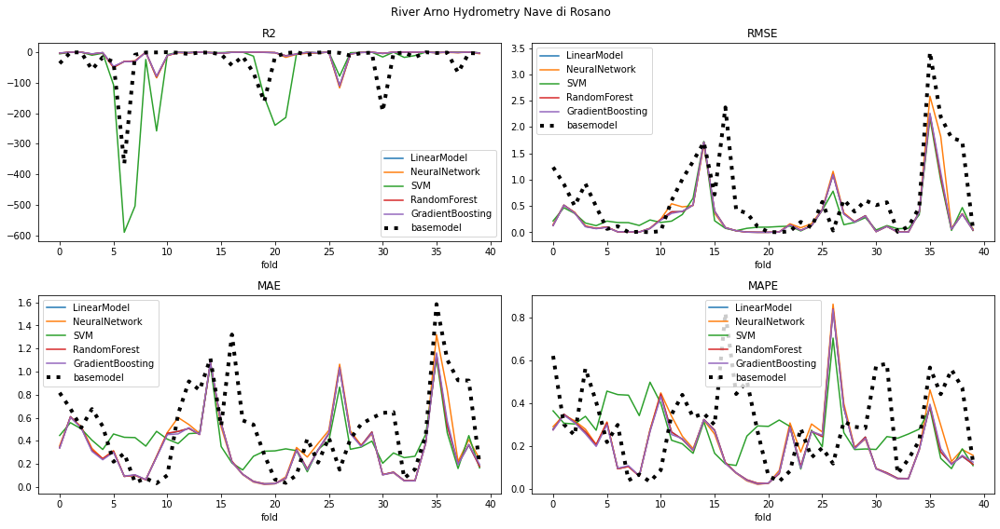

In [30]:
name = 'D%d_phik'%FORECAST_PERIOD
summary_phik, dfscores_phik, dfbasescores = train_and_compare_regressors(names, 
                                                                         dfs, 
                                                                         dfs_basemodel, 
                                                                         reg_names, 
                                                                         regressors, 
                                                                         figname=name)

In [31]:
create_latex_score_tables(dfscores_phik, 'D%d_phik'%(FORECAST_PERIOD), echo=False)

## PPS features

In [32]:
featsdir = os.path.join(datadir, 'feats', 'D%d'%FORECAST_PERIOD, 'automatic', 'pps', '*.csv')

files = glob.glob(featsdir)

dfs = load_data(files)
names = list(dfs.keys())


#################### Processing Aquifer_Auser_Depth_to_Groundwater_COS ####################
#################### Processing Aquifer_Auser_Depth_to_Groundwater_LT2 ####################
#################### Processing Aquifer_Auser_Depth_to_Groundwater_SAL ####################
#################### Processing Aquifer_Petrignano_Depth_to_Groundwater_P24 ####################


c:\users\ui914009\documents\code\udacity\mlengineer\capstone_project\acea\venv\lib\site-packages\pandas\plotting\_matplotlib\core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


#################### Processing Aquifer_Petrignano_Depth_to_Groundwater_P25 ####################
#################### Processing Lake_Bilancino_Flow_Rate ####################
#################### Processing Lake_Bilancino_Lake_Level ####################
#################### Processing River_Arno_Hydrometry_Nave_di_Rosano ####################
No features. Skipping!


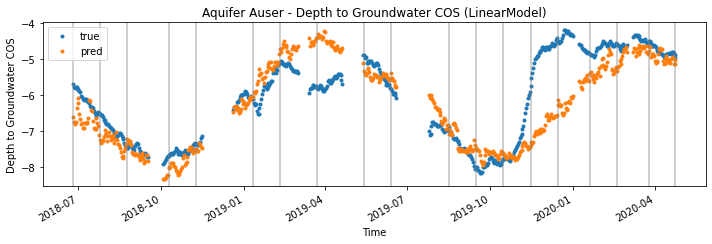

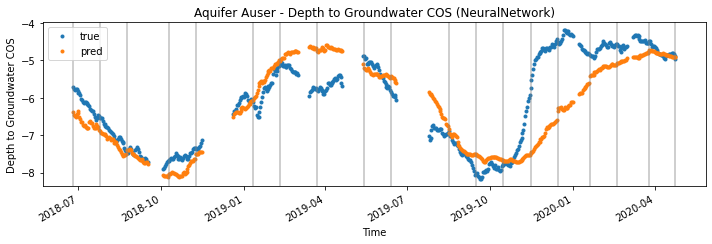

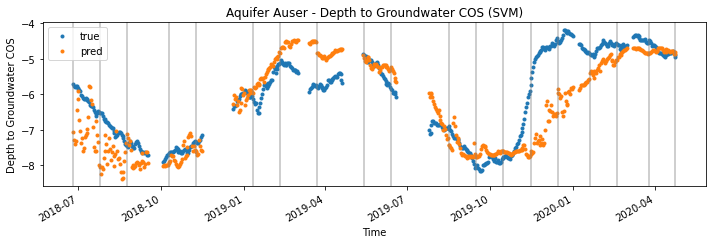

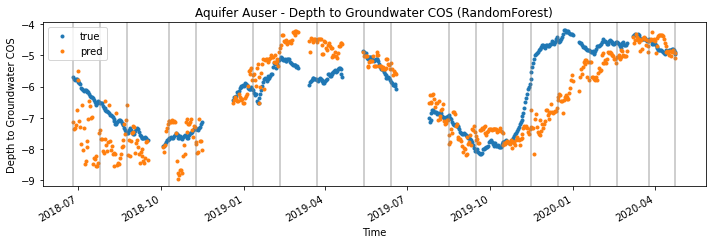

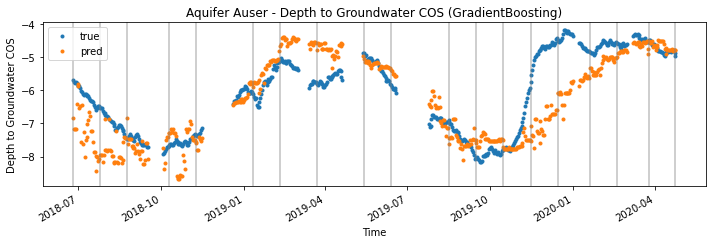

...

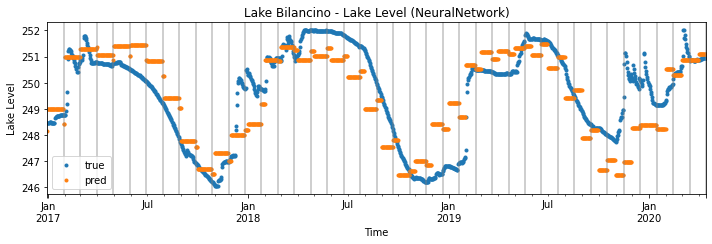

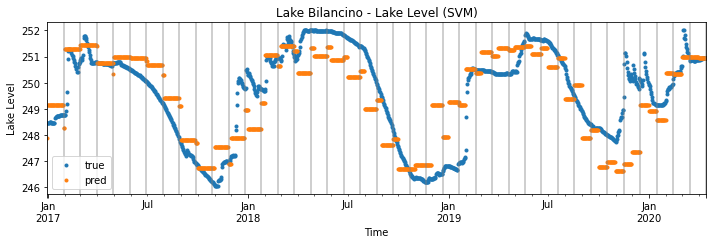

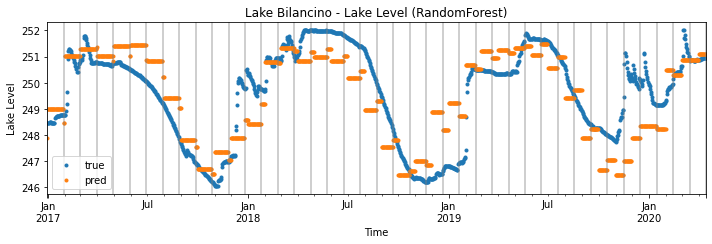

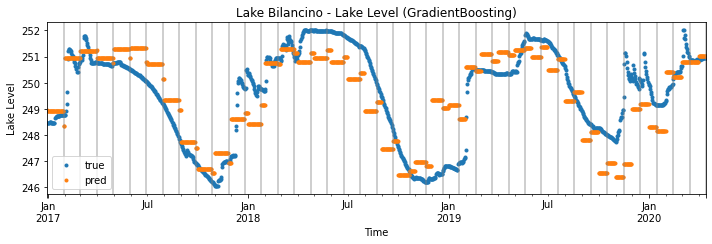

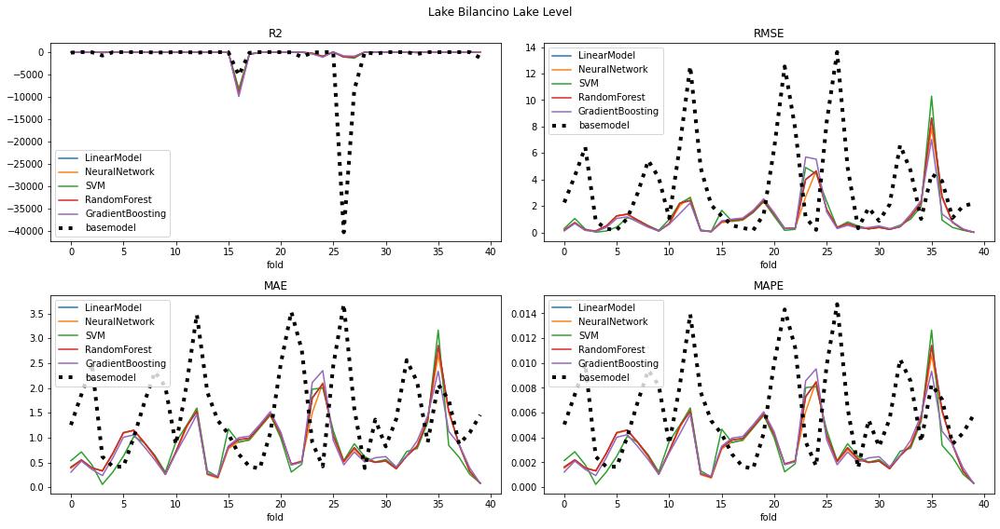

In [33]:
name = 'D%d_pps'%FORECAST_PERIOD
summary_pps, dfscores_pps, dfbasescores = train_and_compare_regressors(names, 
                                                                       dfs, 
                                                                       dfs_basemodel, 
                                                                       reg_names, 
                                                                       regressors,
                                                                       figname=name)

In [34]:
create_latex_score_tables(dfscores_pps, 'D%d_pps'%(FORECAST_PERIOD), echo=False)

## Manually selected features

In [35]:
featsdir = os.path.join(datadir, 'feats', 'D%d'%FORECAST_PERIOD, 'manual', '*.csv')

files = glob.glob(featsdir)

dfs = load_data(files)
names = list(dfs.keys())
names

['Aquifer_Auser_Depth_to_Groundwater_COS',
 'Aquifer_Auser_Depth_to_Groundwater_LT2',
 'Aquifer_Auser_Depth_to_Groundwater_SAL',
 'Aquifer_Petrignano_Depth_to_Groundwater_P24',
 'Aquifer_Petrignano_Depth_to_Groundwater_P25',
 'Lake_Bilancino_Flow_Rate',
 'Lake_Bilancino_Lake_Level',
 'River_Arno_Hydrometry_Nave_di_Rosano']

#################### Processing Aquifer_Auser_Depth_to_Groundwater_COS ####################
#################### Processing Aquifer_Auser_Depth_to_Groundwater_LT2 ####################
#################### Processing Aquifer_Auser_Depth_to_Groundwater_SAL ####################
#################### Processing Aquifer_Petrignano_Depth_to_Groundwater_P24 ####################


c:\users\ui914009\documents\code\udacity\mlengineer\capstone_project\acea\venv\lib\site-packages\pandas\plotting\_matplotlib\core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


#################### Processing Aquifer_Petrignano_Depth_to_Groundwater_P25 ####################
#################### Processing Lake_Bilancino_Flow_Rate ####################
#################### Processing Lake_Bilancino_Lake_Level ####################
#################### Processing River_Arno_Hydrometry_Nave_di_Rosano ####################


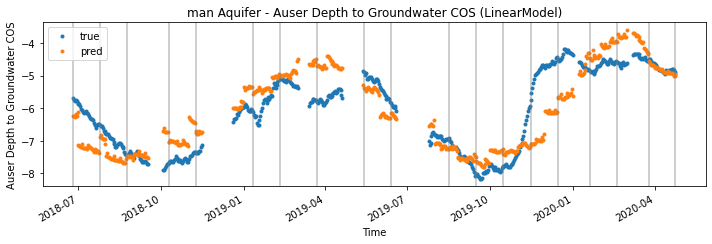

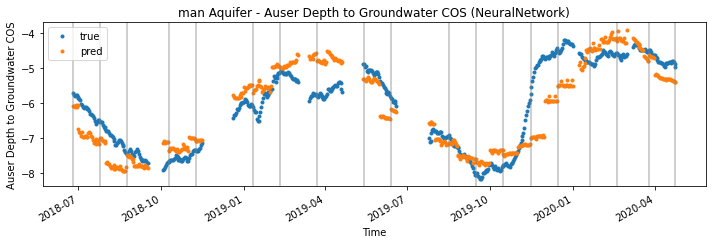

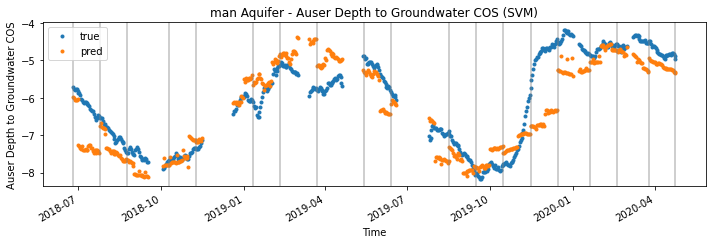

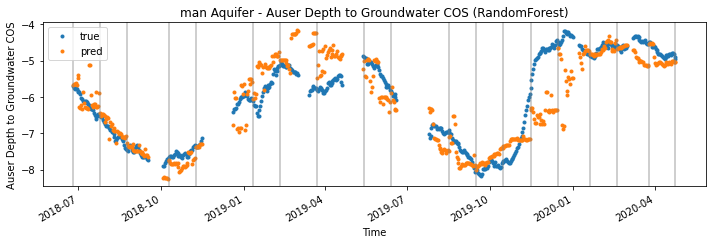

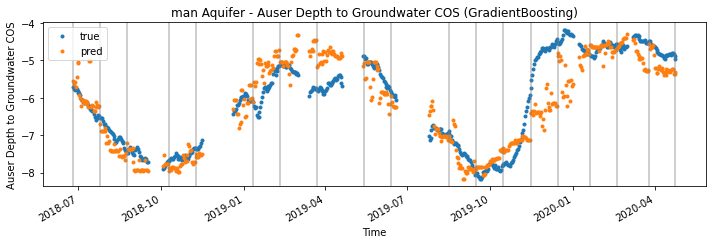

...

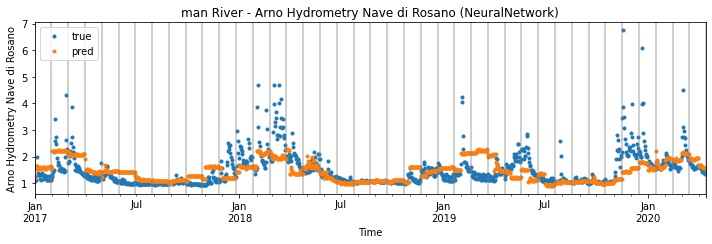

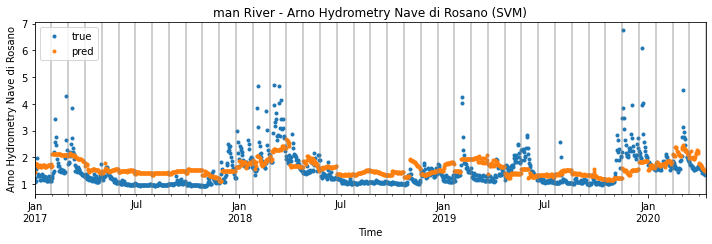

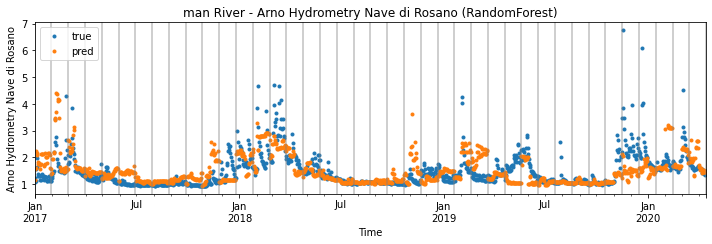

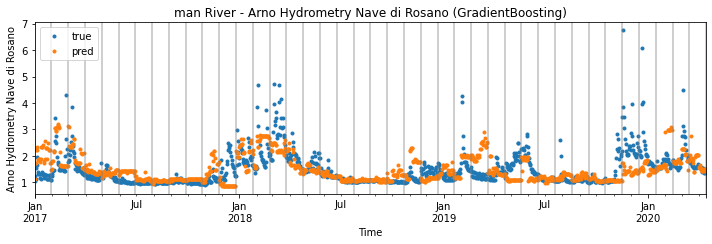

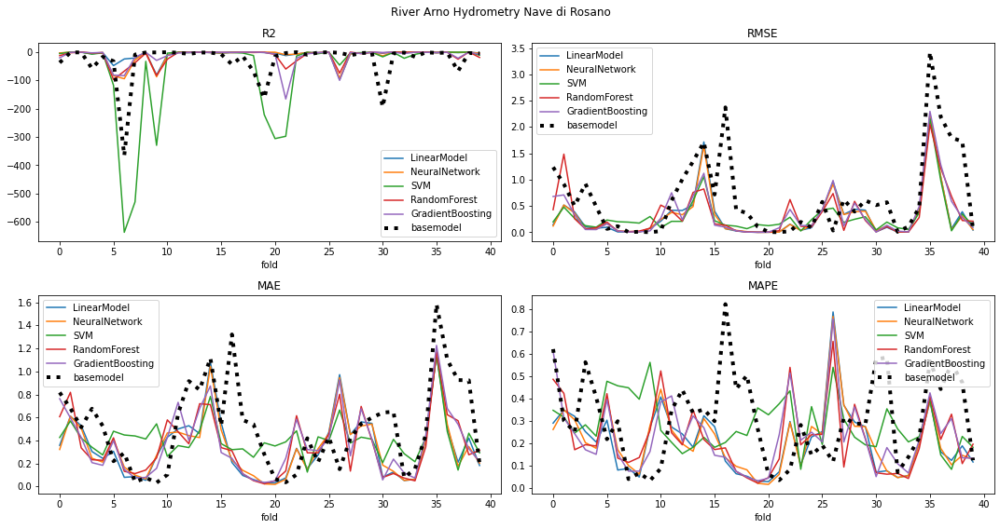

In [36]:
name = 'D%d_man'%FORECAST_PERIOD
summary_man, dfscores_man, dfbasescores = train_and_compare_regressors(names, 
                                                                       dfs, 
                                                                       dfs_basemodel, 
                                                                       reg_names, 
                                                                       regressors,
                                                                       figname=name)

In [37]:
create_latex_score_tables(dfscores_man, 'D%d_man'%(FORECAST_PERIOD), echo=False)

# Selection of model type and feature selection method

In [38]:
metric = 'rmse'

all_scores = [dfscores_pearson, dfscores_phik, dfscores_pps, dfscores_man]
all_methods = ['pearson','phik','pps','manual']

In [39]:
dfbest = get_best_models_df(all_scores, all_methods, metric=metric, echo=True)

Aquifer_Auser_Depth_to_Groundwater_COS
  metric          reg_name      mean       std   method
0     r2  GradientBoosting -4.094535  6.291233  pearson
5   rmse  GradientBoosting  0.299532  0.503909  pearson
Aquifer_Auser_Depth_to_Groundwater_LT2
   metric       reg_name      mean       std method
42     r2  NeuralNetwork -4.091382  3.889724    pps
27   rmse  NeuralNetwork  0.023764  0.024779   phik
Aquifer_Auser_Depth_to_Groundwater_SAL
   metric reg_name       mean        std method
24     r2      SVM -11.458676  24.057432   phik
29   rmse      SVM   0.113858   0.217154   phik
Aquifer_Petrignano_Depth_to_Groundwater_P24
   metric       reg_name      mean       std method
22     r2  NeuralNetwork -7.869428  9.402708   phik
29   rmse            SVM  0.398188  0.279222   phik
Aquifer_Petrignano_Depth_to_Groundwater_P25
   metric reg_name       mean        std method
24     r2      SVM -11.064939  12.136727   phik
29   rmse      SVM   0.251103   0.232212   phik
Lake_Bilancino_Flow_Rate
  

In [40]:
dfbest

,metric,reg_name,mean,std,method,name
5,rmse,GradientBoosting,0.299532,0.503909,pearson,Aquifer_Auser_Depth_to_Groundwater_COS
27,rmse,NeuralNetwork,0.023764,0.024779,phik,Aquifer_Auser_Depth_to_Groundwater_LT2
29,rmse,SVM,0.113858,0.217154,phik,Aquifer_Auser_Depth_to_Groundwater_SAL
29,rmse,SVM,0.398188,0.279222,phik,Aquifer_Petrignano_Depth_to_Groundwater_P24
29,rmse,SVM,0.251103,0.232212,phik,Aquifer_Petrignano_Depth_to_Groundwater_P25
5,rmse,GradientBoosting,13.321826,28.586494,pearson,Lake_Bilancino_Flow_Rate
29,rmse,SVM,0.920202,1.077469,phik,Lake_Bilancino_Lake_Level
49,rmse,SVM,0.299538,0.374103,manual,River_Arno_Hydrometry_Nave_di_Rosano


In [41]:
dfbest.to_csv('results/D%s_best_models_and_features_%s.csv'%(FORECAST_PERIOD, metric), index=False)